In [1]:
# Import the necessary packages

import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense , Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [2]:
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 


In [3]:
os.listdir('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images')

['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']

In [4]:
os.listdir(os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\train.csv', 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild'))

['0024cdab0c1e.png',
 '00cb6555d108.png',
 '0124dffecf29.png',
 '01b3aed3ed4c.png',
 '0369f3efe69b.png',
 '03e25101e8e8.png',
 '04ac765f91a1.png',
 '059bc89df7f4.png',
 '05a5183c92d0.png',
 '0684311afdfc.png',
 '06b71823f9cd.png',
 '07929d32b5b3.png',
 '07a1c7073982.png',
 '086d41d17da8.png',
 '09935d72892b.png',
 '0a3202889f4d.png',
 '0a61bddab956.png',
 '0ad7f631dedb.png',
 '0d310aba6373.png',
 '0dc031c94225.png',
 '0dce95217626.png',
 '0eb52045349f.png',
 '0f495d87656a.png',
 '0fb1053285cf.png',
 '101b9ebfc720.png',
 '107aea0d9289.png',
 '10f36b0239fb.png',
 '1116271db4ea.png',
 '111898ab463d.png',
 '12ce6a1a1f31.png',
 '12e3f5f2cb17.png',
 '13ab8db8c700.png',
 '15cc2aef772a.png',
 '172df1330a60.png',
 '17eff993386f.png',
 '18b06f56ab27.png',
 '194814669fee.png',
 '19722bff5a09.png',
 '19e350c7c83c.png',
 '1a03a7970337.png',
 '1b329a127307.png',
 '1bb0ddfe753a.png',
 '1c0cf251b426.png',
 '1c3a6b4449e9.png',
 '1d11794057ff.png',
 '1d674e2e32e0.png',
 '1df3e03a8f5f.png',
 '1e8a1fdee5b

In [5]:
# Check the number of images in the dataset
train = []
label = []


In [6]:
# os.listdir returns the list of files in the folder, in this case image class names
for i in os.listdir('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images'):
  train_class = os.listdir(os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images', i))
  for j in train_class:
    img = os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images', i, j)
    train.append(img)
    label.append(i)

print('Number of train images : {} \n'.format(len(train)))

Number of train images : 3662 



In [7]:
train

['C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\0024cdab0c1e.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\00cb6555d108.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\0124dffecf29.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\01b3aed3ed4c.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\0369f3efe69b.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\03e25101e8e8.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\04ac765f91a1.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\059bc89df7f4.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\05a5183c92d0.png',
 'C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images\\Mild\\0684311af

In [8]:
label


['Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 'Mild',
 

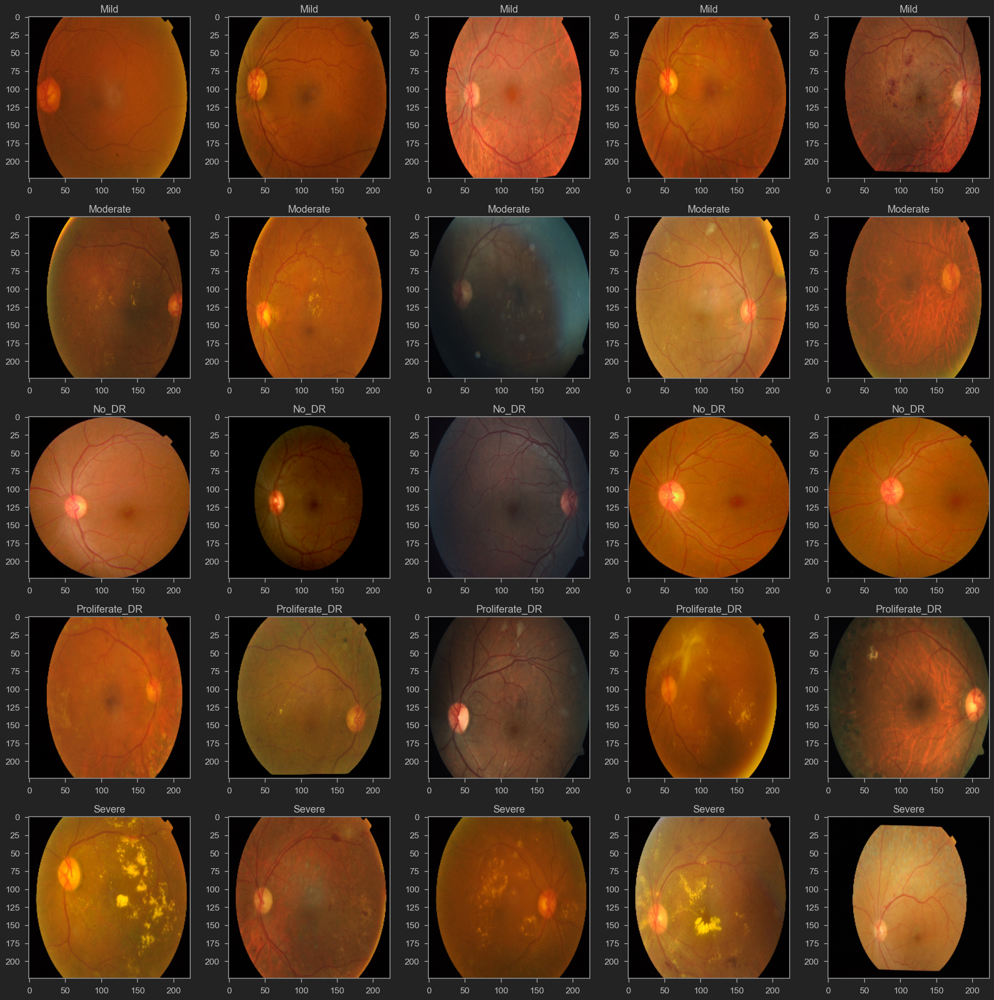

In [9]:
# Visualize 5 images for each class in the dataset

fig, axs = plt.subplots(5, 5, figsize = (20, 20))
count = 0
for i in os.listdir('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images'):
  # get the list of images in a given class
  train_class = os.listdir(os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images', i))
  # plot 5 images per class
  for j in range(5):
    img = os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images', i, train_class[j])
    img = PIL.Image.open(img)
    axs[count][j].title.set_text(i)
    axs[count][j].imshow(img)  
  count += 1

fig.tight_layout()

In [10]:
# check the number of images in each class in the training dataset

No_images_per_class = []
Class_name = []
for i in os.listdir('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images'):
  train_class = os.listdir(os.path.join('C:\\Users\\Lenovo\\Desktop\\DR_project\\dataset\\archive\\colored_images', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in Mild = 370 

Number of images in Moderate = 999 

Number of images in No_DR = 1805 

Number of images in Proliferate_DR = 295 

Number of images in Severe = 193 



In [11]:
retina_df = pd.DataFrame({'Image': train,'Labels': label})
retina_df

,Image,Labels
0,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Mild
1,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Mild
2,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Mild
3,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Mild
4,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Mild
...,...,...
3657,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Severe
3658,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Severe
3659,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Severe
3660,C:\Users\Lenovo\Desktop\DR_project\dataset\arc...,Severe


In [12]:
# Shuffle the data and split it into training and testing
retina_df = shuffle(retina_df)
train, test = train_test_split(retina_df, test_size = 0.2)

In [13]:

# Define input shape and number of classes
input_shape = (256, 256, 3)
num_classes = 5

In [14]:

# Load the pre-trained VGG19 model
base_model = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)


In [15]:

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

In [16]:

# Add custom top layers for classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)


In [17]:

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)




In [18]:

# Define data directories
train_dir = 'data/train'
validation_dir = 'data/validation'

In [19]:
# Define data generators with data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)


In [20]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)


FileNotFoundError: [WinError 3] The system cannot find the path specified: 'data/train'

In [21]:
train_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='training')

validation_generator = train_datagen.flow_from_dataframe(
    train,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32,
    subset='validation')

test_generator = test_datagen.flow_from_dataframe(
    test,
    directory='./',
    x_col="Image",
    y_col="Labels",
    target_size=(256, 256),
    color_mode="rgb",
    class_mode="categorical",
    batch_size=32)

Found 2929 validated image filenames belonging to 5 classes.
Found 0 validated image filenames belonging to 5 classes.
Found 733 validated image filenames belonging to 5 classes.


In [22]:

# Compile the model
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['accuracy'])


In [23]:

# Train the model
model.fit(train_generator, validation_data=test_generator, epochs=18)


Epoch 1/18
92/92 [==============================] - 825s 9s/step - loss: 1.0687 - accuracy: 0.6163 - val_loss: 0.9381 - val_accuracy: 0.6726
Epoch 2/18
92/92 [==============================] - 842s 9s/step - loss: 0.9295 - accuracy: 0.6678 - val_loss: 0.9552 - val_accuracy: 0.6480
Epoch 3/18
92/92 [==============================] - 847s 9s/step - loss: 0.8884 - accuracy: 0.6927 - val_loss: 0.8497 - val_accuracy: 0.7080
Epoch 4/18
92/92 [==============================] - 844s 9s/step - loss: 0.8658 - accuracy: 0.6890 - val_loss: 0.8641 - val_accuracy: 0.6958
Epoch 5/18
92/92 [==============================] - 841s 9s/step - loss: 0.8415 - accuracy: 0.7002 - val_loss: 0.8220 - val_accuracy: 0.7053
Epoch 6/18
92/92 [==============================] - 837s 9s/step - loss: 0.8366 - accuracy: 0.6972 - val_loss: 0.8043 - val_accuracy: 0.7121
Epoch 7/18
92/92 [==============================] - 863s 9s/step - loss: 0.8439 - accuracy: 0.6972 - val_loss: 0.8436 - val_accuracy: 0.6985
Epoch 8/18
92

KeyboardInterrupt: 

In [24]:
# Save the trained model


model.save('models/diabetic_retinopathy_vgg19_model.h5')


C:\Users\Lenovo\anaconda3\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [25]:
# Evaluate the performance of the model
evaluate = model.evaluate(test_generator, steps = test_generator.n // 32, verbose =1)

print('Accuracy Test : {}'.format(evaluate[1]))

22/22 [==============================] - 162s 7s/step - loss: 0.9442 - accuracy: 0.6619
Accuracy Test : 0.6619318127632141


In [26]:
# Assigning label names to the corresponding indexes
labels = {0: 'Mild', 1: 'Moderate', 2: 'No_DR', 3:'Proliferate_DR', 4: 'Severe'}




In [27]:
# Loading images and their predictions 

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import cv2

prediction = []
original = []
image = []
count = 0

for item in range(len(test)):
  #code to open the image
  img= PIL.Image.open(test['Image'].tolist()[item])
  #resizing the image to (256,256)
  img = img.resize((256,256))
  #appending image to the image list
  image.append(img)
  #converting image to array
  img = np.asarray(img, dtype= np.float32)
  #normalizing the image
  img = img / 255
  #reshaping the image in to a 4D array
  img = img.reshape(-1,256,256,3)
  #making prediction of the model
  predict = model.predict(img)
  #getting the index corresponding to the highest value in the prediction
  predict = np.argmax(predict)
  #appending the predicted class to the list
  prediction.append(labels[predict])
  #appending original class to the list
  original.append(test['Labels'].tolist()[item])


1/1 [==============================] - 0s 235ms/step


In [28]:


#Getting the test accuracy 
score = accuracy_score(original,prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.6439290586630286


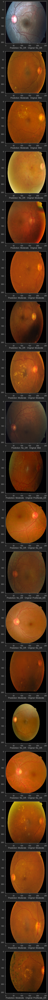

In [29]:
# Visualizing the results
import random
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [30]:
# Assigning label names to the corresponding indexes
labels = {0: 'Mild', 1: 'Moderate', 2: 'No_DR', 3:'Proliferate_DR', 4: 'Severe'}


In [31]:
# Loading images and their predictions 

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import cv2

prediction = []
original = []
image = []
count = 0

for item in range(len(test)):
  #code to open the image
  img= PIL.Image.open(test['Image'].tolist()[item])
  #resizing the image to (256,256)
  img = img.resize((256,256))
  #appending image to the image list
  image.append(img)
  #converting image to array
  img = np.asarray(img, dtype= np.float32)
  #normalizing the image
  img = img / 255
  #reshaping the image in to a 4D array
  img = img.reshape(-1,256,256,3)
  #making prediction of the model
  predict = model.predict(img)
  #getting the index corresponding to the highest value in the prediction
  predict = np.argmax(predict)
  #appending the predicted class to the list
  prediction.append(labels[predict])
  #appending original class to the list
  original.append(test['Labels'].tolist()[item])


1/1 [==============================] - 0s 336ms/step


In [32]:

 

#Getting the test accuracy 
score = accuracy_score(original,prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.6439290586630286


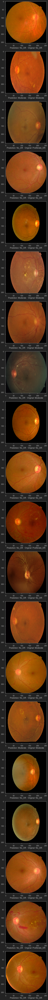

In [33]:
# Visualizing the results
import random
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

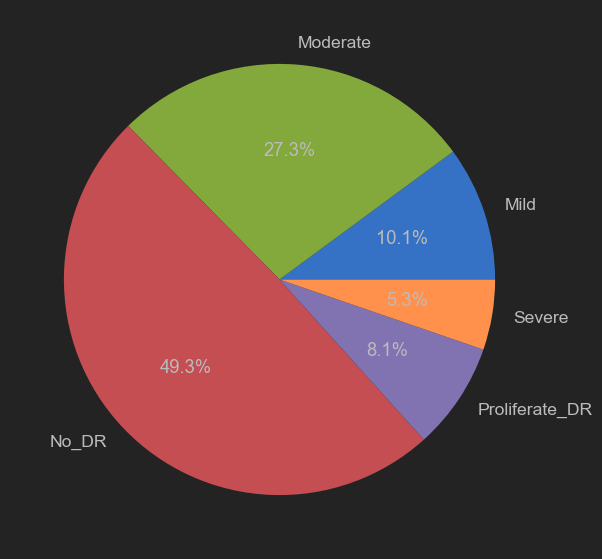

In [34]:
No_images_per_class
Class_name
fig1, ax1 = plt.subplots()
ax1.pie(No_images_per_class, labels = Class_name, autopct = '%1.1f%%')
plt.show



In [35]:
tf.keras.preprocessing.image.ImageDataGenerator(
      featurewise_center=False,
      samplewise_center=False,
      featurewise_std_normalization=False,
      samplewise_std_normalization=False,
      zca_whitening=False,
      zca_epsilon=1e-06,
      rotation_range=0,
      width_shift_range=0.0,
      height_shift_range=0.0,
      brightness_range=None,
      shear_range=0.0,
      zoom_range=0.0,
      channel_shift_range=0.0,
      fill_mode="nearest",
      cval=0.0,
      horizontal_flip=False,
      vertical_flip=False,
      rescale=None,
      preprocessing_function=None,
      data_format=None,
      validation_split=0.3,
      dtype=None)

In [36]:
# Print out the classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))


                precision    recall  f1-score   support

          Mild       0.00      0.00      0.00        64
      Moderate       0.58      0.60      0.59       213
         No_DR       0.67      1.00      0.80       345
Proliferate_DR       0.00      0.00      0.00        68
        Severe       0.00      0.00      0.00        43

      accuracy                           0.64       733
     macro avg       0.25      0.32      0.28       733
  weighted avg       0.48      0.64      0.55       733



C:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
